In [9]:
import ee
import geemap
import pandas as pd

ee.Initialize()

nlcd_collection = ee.ImageCollection("projects/sat-io/open-datasets/USGS/ANNUAL_NLCD/LANDCOVER")
nlcd_1985 = nlcd_collection.filter(ee.Filter.eq('year', 1985)).first().select('b1')
nlcd_1990 = nlcd_collection.filter(ee.Filter.eq('year', 1990)).first().select('b1')

counties = ee.FeatureCollection("TIGER/2018/Counties")
palm_beach = counties.filter(
    ee.Filter.And(
        ee.Filter.eq('STATEFP', '12'),
        ee.Filter.eq('NAME', 'Palm Beach')
    )
).geometry()

developed_classes = [21, 22, 23, 24]
scale = 30
sqm_to_sqmi = 3.86102159e-7

def calculate_developed_area(image, geometry):
    mask = image.remap(developed_classes, [1]*len(developed_classes)).selfMask()
    area_image = mask.multiply(ee.Image.pixelArea()).rename('area')
    stats = area_image.reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=geometry,
        scale=scale,
        maxPixels=1e13
    )
    area_m2 = stats.get('area')
    return ee.Number(area_m2).multiply(sqm_to_sqmi)

county_area_m2 = ee.Image.pixelArea().reduceRegion(
    reducer=ee.Reducer.sum(),
    geometry=palm_beach,
    scale=scale,
    maxPixels=1e13
).get('area')

county_area_sqmi = ee.Number(county_area_m2).multiply(sqm_to_sqmi)

developed_area_1985 = calculate_developed_area(nlcd_1985, palm_beach)
developed_area_1990 = calculate_developed_area(nlcd_1990, palm_beach)

undeveloped_area_1985 = county_area_sqmi.subtract(developed_area_1985)
undeveloped_area_1990 = county_area_sqmi.subtract(developed_area_1990)

abs_change = developed_area_1990.subtract(developed_area_1985)
pct_growth = abs_change.divide(developed_area_1985).multiply(100)

results = ee.Dictionary({
    'County Area (sq mi)': county_area_sqmi,
    'Developed Area 1985 (sq mi)': developed_area_1985,
    'Developed Area 1990 (sq mi)': developed_area_1990,
    'Undeveloped Area 1985 (sq mi)': undeveloped_area_1985,
    'Undeveloped Area 1990 (sq mi)': undeveloped_area_1990,
    'Absolute Developed Area Change (sq mi)': abs_change,
    'Percentage Developed Area Growth (%)': pct_growth
}).getInfo()

print("Palm Beach County LULC Analysis (1985 vs 1990)")
for k, v in results.items():
    if isinstance(v, float):
        print(f"{k}: {v:.4f}")
    else:
        print(f"{k}: {v}")

import pandas as pd
df = pd.DataFrame({
    'Year': ['1985', '1990'],
    'County Area (sq mi)': [results['County Area (sq mi)']] * 2,
    'Developed Area (sq mi)': [results['Developed Area 1985 (sq mi)'], results['Developed Area 1990 (sq mi)']],
    'Undeveloped Area (sq mi)': [results['Undeveloped Area 1985 (sq mi)'], results['Undeveloped Area 1990 (sq mi)']]
})
change_row = pd.DataFrame({
    'Year': ['Change Summary'],
    'County Area (sq mi)': ['-'],
    'Developed Area (sq mi)': [results['Absolute Developed Area Change (sq mi)']],
    'Undeveloped Area (sq mi)': [f"{results['Percentage Developed Area Growth (%)']:.2f} %"]
})
df = pd.concat([df, change_row], ignore_index=True)
print("\nSummary Table:")
print(df)


Palm Beach County LULC Analysis (1985 vs 1990)
Absolute Developed Area Change (sq mi): 21.9806
County Area (sq mi): 2383.1341
Developed Area 1985 (sq mi): 403.7258
Developed Area 1990 (sq mi): 425.7064
Percentage Developed Area Growth (%): 5.4444
Undeveloped Area 1985 (sq mi): 1979.4083
Undeveloped Area 1990 (sq mi): 1957.4277

Summary Table:
             Year County Area (sq mi)  Developed Area (sq mi)  \
0            1985         2383.134089              403.725758   
1            1990         2383.134089              425.706371   
2  Change Summary                   -               21.980614   

  Undeveloped Area (sq mi)  
0              1979.408331  
1              1957.427717  
2                   5.44 %  


In [23]:
import ee
import pandas as pd
import folium

# Initialize Earth Engine
ee.Initialize()

# --- UPDATED: Target years now include 2024 as requested. ---
# WARNING: The NLCD dataset does NOT have data for 2024. This will cause an error.
nlcd_collection = ee.ImageCollection("projects/sat-io/open-datasets/USGS/ANNUAL_NLCD/LANDCOVER")
target_years = [1985, 1995, 2005, 2015, 2024]

# Extract images for each year
# This will fail for 2024 as nlcd_collection.filter(...).first() will return None.
nlcd_images = {
    year: nlcd_collection.filter(ee.Filter.eq('year', year)).first().select('b1')
    for year in target_years
}

# Get Palm Beach County geometry
counties = ee.FeatureCollection("TIGER/2018/Counties")
palm_beach = counties.filter(
    ee.Filter.And(
        ee.Filter.eq('STATEFP', '12'),
        ee.Filter.eq('NAME', 'Palm Beach')
    )
).first()
palm_beach_geom = palm_beach.geometry()

# Define developed classes and scale
developed_classes = [21, 22, 23, 24] # Open Space, Low, Medium, High Intensity
scale = 30
sqm_to_sqmi = 3.86102159e-7

# Function to calculate developed area
def calculate_developed_area(image, geometry):
    mask = image.remap(developed_classes, [1] * len(developed_classes), 0).selfMask()
    area_image = mask.multiply(ee.Image.pixelArea()).rename('area')
    stats = area_image.reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=geometry,
        scale=scale,
        maxPixels=1e13
    )
    return ee.Number(stats.get('area')).multiply(sqm_to_sqmi)

# Get total area of Palm Beach County
county_area_m2 = palm_beach_geom.area(maxError=1)
county_area_sqmi = ee.Number(county_area_m2).multiply(sqm_to_sqmi)

# Calculate developed areas for each year
developed_areas = {
    year: calculate_developed_area(image, palm_beach_geom)
    for year, image in nlcd_images.items()
}

# Function to compute UEII
def compute_ueii(area_t1, area_t2, delta_t, total_area):
    # Formula: ((Urban Area at T2 - Urban Area at T1) / (Total Land Area * Time Difference)) * 100
    return (area_t2.subtract(area_t1).divide(total_area.multiply(delta_t))).multiply(100)

# --- UPDATED: Calculate UEII for the 2015-2024 interval ---
ueii_intervals = {
    '1985-1995': compute_ueii(developed_areas[1985], developed_areas[1995], 10, county_area_sqmi),
    '1995-2005': compute_ueii(developed_areas[1995], developed_areas[2005], 10, county_area_sqmi),
    '2005-2015': compute_ueii(developed_areas[2005], developed_areas[2015], 10, county_area_sqmi),
    '2015-2024': compute_ueii(developed_areas[2015], developed_areas[2024], 9, county_area_sqmi), # Correct delta_t is 9 years
}

# Get values into Python
# This section will fail when it tries to get info for the 2024 calculations.
county_area_val = county_area_sqmi.getInfo()
developed_area_vals = {year: val.getInfo() for year, val in developed_areas.items()}
ueii_vals = {k: v.getInfo() for k, v in ueii_intervals.items()}

# Build DataFrame
df_data = {
    'S.N.': 1,
    'County': 'Palm Beach',
    'County Area (sq mi)': county_area_val
}
for year, area in developed_area_vals.items():
    df_data[f'Developed Area {year} (sq mi)'] = area
for interval, ueii in ueii_vals.items():
    df_data[f'UEII {interval} (%)'] = round(ueii, 2)

df = pd.DataFrame([df_data])

# --- REMOVED: The code to save the Excel file has been commented out. ---
# df.to_excel("palm_beach_ueii_summary.xlsx", index=False)
# print("✅ Excel file saving has been disabled.")

print("DataFrame created. Displaying DataFrame:")
print(df.to_string())


# ----------------------------------------
# Folium Map Output
# ----------------------------------------

developed_vis_params = {
    'min': 1, 'max': 4, 'palette': ['#ffffb2', '#fecc5c', '#fd8d3c', '#e31a1c']
}

def create_developed_vis_image(image):
    return image.remap(developed_classes, [1, 2, 3, 4]).selfMask()

center = palm_beach_geom.centroid().coordinates().getInfo()[::-1]
m = folium.Map(location=center, zoom_start=9)

def add_ee_layer(self, ee_image_object, vis_params, name):
    map_id_dict = ee.Image(ee_image_object).getMapId(vis_params)
    folium.raster_layers.TileLayer(
        tiles=map_id_dict['tile_fetcher'].url_format,
        attr='Google Earth Engine',
        name=name,
        overlay=True,
        control=True,
    ).add_to(self)

folium.Map.add_ee_layer = add_ee_layer

# Add all years as layers to the map
# The loop will fail when it reaches the non-existent 2024 image.
for year, image in nlcd_images.items():
    vis_image = create_developed_vis_image(image.clip(palm_beach_geom))
    m.add_ee_layer(vis_image, developed_vis_params, f'Developed Land {year}')

folium.GeoJson(
    data=palm_beach.getInfo(),
    name='Palm Beach County Boundary',
    style_function=lambda x: {'color': 'black', 'fillOpacity': 0, 'weight': 2}
).add_to(m)

folium.LayerControl().add_to(m)
# m.save('palm_beach_development_map.html')

# Display map in notebook
m

✅ Excel file saved as 'palm_beach_ueii_summary.xlsx'
✅ Map saved as 'palm_beach_map.html'


In [37]:
import ee
import pandas as pd
import folium

# Initialize Earth Engine
ee.Initialize()

# --- UPDATED: Target years now include 2024 as requested. ---
# WARNING: The NLCD dataset does NOT have data for 2024. This will cause an error.
nlcd_collection = ee.ImageCollection("projects/sat-io/open-datasets/USGS/ANNUAL_NLCD/LANDCOVER")
target_years = [1985, 1995, 2005, 2015, 2024]

# Extract images for each year
# This will fail for 2024 as nlcd_collection.filter(...).first() will return None.
nlcd_images = {
    year: nlcd_collection.filter(ee.Filter.eq('year', year)).first().select('b1')
    for year in target_years
}

# Get Palm Beach County geometry
counties = ee.FeatureCollection("TIGER/2018/Counties")
palm_beach = counties.filter(
    ee.Filter.And(
        ee.Filter.eq('STATEFP', '12'),
        ee.Filter.eq('NAME', 'Palm Beach')
    )
).first()
palm_beach_geom = palm_beach.geometry()

# Define developed classes and scale
developed_classes = [21, 22, 23, 24] # Open Space, Low, Medium, High Intensity
scale = 30
sqm_to_sqmi = 3.86102159e-7

# Function to calculate developed area
def calculate_developed_area(image, geometry):
    mask = image.remap(developed_classes, [1] * len(developed_classes), 0).selfMask()
    area_image = mask.multiply(ee.Image.pixelArea()).rename('area')
    stats = area_image.reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=geometry,
        scale=scale,
        maxPixels=1e13
    )
    return ee.Number(stats.get('area')).multiply(sqm_to_sqmi)

# Get total area of Palm Beach County
county_area_m2 = palm_beach_geom.area(maxError=1)
county_area_sqmi = ee.Number(county_area_m2).multiply(sqm_to_sqmi)

# Calculate developed areas for each year
developed_areas = {
    year: calculate_developed_area(image, palm_beach_geom)
    for year, image in nlcd_images.items()
}

# Function to compute UEII
def compute_ueii(area_t1, area_t2, delta_t, total_area):
    # Formula: ((Urban Area at T2 - Urban Area at T1) / (Total Land Area * Time Difference)) * 100
    return (area_t2.subtract(area_t1).divide(total_area.multiply(delta_t))).multiply(100)

# --- UPDATED: Calculate UEII for the 2015-2024 interval ---
ueii_intervals = {
    '1985-1995': compute_ueii(developed_areas[1985], developed_areas[1995], 10, county_area_sqmi),
    '1995-2005': compute_ueii(developed_areas[1995], developed_areas[2005], 10, county_area_sqmi),
    '2005-2015': compute_ueii(developed_areas[2005], developed_areas[2015], 10, county_area_sqmi),
    '2015-2024': compute_ueii(developed_areas[2015], developed_areas[2024], 9, county_area_sqmi), # Correct delta_t is 9 years
}

# Get values into Python
# This section will fail when it tries to get info for the 2024 calculations.
county_area_val = county_area_sqmi.getInfo()
developed_area_vals = {year: val.getInfo() for year, val in developed_areas.items()}
ueii_vals = {k: v.getInfo() for k, v in ueii_intervals.items()}

# Build DataFrame
df_data = {
    'S.N.': 1,
    'County': 'Palm Beach',
    'County Area (sq mi)': county_area_val
}
for year, area in developed_area_vals.items():
    df_data[f'Developed Area {year} (sq mi)'] = area
for interval, ueii in ueii_vals.items():
    df_data[f'UEII {interval} (%)'] = round(ueii, 2)

df = pd.DataFrame([df_data])

# --- REMOVED: The code to save the Excel file has been commented out. ---
# df.to_excel("palm_beach_ueii_summary.xlsx", index=False)
# print("✅ Excel file saving has been disabled.")

print("DataFrame created. Displaying DataFrame:")
print(df.to_string())


# ----------------------------------------
# Folium Map Output
# ----------------------------------------

developed_vis_params = {
    'min': 1, 'max': 4, 'palette': ['#ffffb2', '#fecc5c', '#fd8d3c', '#e31a1c']
}

def create_developed_vis_image(image):
    return image.remap(developed_classes, [1, 2, 3, 4]).selfMask()

center = palm_beach_geom.centroid().coordinates().getInfo()[::-1]
m = folium.Map(location=center, zoom_start=9)

def add_ee_layer(self, ee_image_object, vis_params, name):
    map_id_dict = ee.Image(ee_image_object).getMapId(vis_params)
    folium.raster_layers.TileLayer(
        tiles=map_id_dict['tile_fetcher'].url_format,
        attr='Google Earth Engine',
        name=name,
        overlay=True,
        control=True,
    ).add_to(self)

folium.Map.add_ee_layer = add_ee_layer

# Add all years as layers to the map
# The loop will fail when it reaches the non-existent 2024 image.
for year, image in nlcd_images.items():
    vis_image = create_developed_vis_image(image.clip(palm_beach_geom))
    m.add_ee_layer(vis_image, developed_vis_params, f'Developed Land {year}')

folium.GeoJson(
    data=palm_beach.getInfo(),
    name='Palm Beach County Boundary',
    style_function=lambda x: {'color': 'black', 'fillOpacity': 0, 'weight': 2}
).add_to(m)

folium.LayerControl().add_to(m)
# m.save('palm_beach_development_map.html')

# Display map in notebook
m

DataFrame created. Displaying DataFrame:
   S.N.      County  County Area (sq mi)  Developed Area 1985 (sq mi)  Developed Area 1995 (sq mi)  Developed Area 2005 (sq mi)  Developed Area 2015 (sq mi)  Developed Area 2024 (sq mi)  UEII 1985-1995 (%)  UEII 1995-2005 (%)  UEII 2005-2015 (%)  UEII 2015-2024 (%)
0     1  Palm Beach           2387.39491                   403.725758                   434.746704                   475.725213                   492.782563                   513.064861                0.13                0.17                0.07                0.09


In [53]:
import ee
import pandas as pd
import folium

# Initialize Earth Engine
try:
    ee.Initialize()
except Exception as e:
    ee.Authenticate()
    ee.Initialize()

# --- 1. SETUP ---
nlcd_collection = ee.ImageCollection("projects/sat-io/open-datasets/USGS/ANNUAL_NLCD/LANDCOVER")
target_years = [1985, 1995, 2005, 2015, 2024]
developed_classes = [21, 22, 23, 24]
scale = 30
sqm_to_sqmi = 3.86102159e-7

nlcd_images = ee.Dictionary({
    year: nlcd_collection.filter(ee.Filter.eq('year', year)).first().select('b1')
    for year in target_years
})

counties_collection = ee.FeatureCollection("TIGER/2018/Counties")
florida_counties = counties_collection.filter(ee.Filter.eq('STATEFP', '12'))

# --- 2. FUNCTIONS ---
def calculate_developed_area(image, geometry):
    mask = image.remap(developed_classes, [1] * len(developed_classes), 0).selfMask()
    area_image = mask.multiply(ee.Image.pixelArea()).rename('area')
    stats = area_image.reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=geometry,
        scale=scale,
        maxPixels=1e13
    )
    return ee.Number(stats.get('area')).multiply(sqm_to_sqmi)

def compute_ueii(area_t1, area_t2, delta_t, total_area):
    return (ee.Number(area_t2).subtract(area_t1)
            .divide(ee.Number(total_area).multiply(delta_t))).multiply(100)

def analyze_county(feature):
    geom = feature.geometry()
    county_area_sqmi = ee.Number(geom.area(maxError=1)).multiply(sqm_to_sqmi)
    dev_areas = ee.Dictionary({
        str(year): calculate_developed_area(ee.Image(nlcd_images.get(str(year))), geom)
        for year in target_years
    })
    ueii_85_95 = compute_ueii(dev_areas.get('1985'), dev_areas.get('1995'), 10, county_area_sqmi)
    ueii_95_05 = compute_ueii(dev_areas.get('1995'), dev_areas.get('2005'), 10, county_area_sqmi)
    ueii_05_15 = compute_ueii(dev_areas.get('2005'), dev_areas.get('2015'), 10, county_area_sqmi)
    ueii_15_24 = compute_ueii(dev_areas.get('2015'), dev_areas.get('2024'), 9, county_area_sqmi)
    return feature.set({
        'County Area (sq mi)': county_area_sqmi,
        'Developed Area 1985 (sq mi)': dev_areas.get('1985'),
        'Developed Area 1995 (sq mi)': dev_areas.get('1995'),
        'Developed Area 2005 (sq mi)': dev_areas.get('2005'),
        'Developed Area 2015 (sq mi)': dev_areas.get('2015'),
        'Developed Area 2024 (sq mi)': dev_areas.get('2024'),
        'UEII 1985-1995 (%)': ueii_85_95,
        'UEII 1995-2005 (%)': ueii_95_05,
        'UEII 2005-2015 (%)': ueii_05_15,
        'UEII 2015-2024 (%)': ueii_15_24
    })

# --- 3. BATCH PROCESSING ---
county_list = florida_counties.toList(florida_counties.size())
batch_size = 5
n_counties = florida_counties.size().getInfo()

all_features = []
for start in range(0, n_counties, batch_size):
    subset = ee.FeatureCollection(county_list.slice(start, start + batch_size))
    subset_results = subset.map(analyze_county).getInfo()
    all_features.extend(subset_results['features'])

# --- 4. BUILD DATAFRAME ---
data_for_df = []
for i, feature in enumerate(all_features):
    props = feature['properties']
    row_data = {'S.N.': i + 1, 'County': props['NAME']}
    row_data.update(props)
    data_for_df.append(row_data)

df = pd.DataFrame(data_for_df)
final_columns = [
    'S.N.', 'County', 'County Area (sq mi)',
    'Developed Area 1985 (sq mi)', 'Developed Area 1995 (sq mi)',
    'Developed Area 2005 (sq mi)', 'Developed Area 2015 (sq mi)',
    'Developed Area 2024 (sq mi)', 'UEII 1985-1995 (%)',
    'UEII 1995-2005 (%)', 'UEII 2005-2015 (%)', 'UEII 2015-2024 (%)'
]
df = df[final_columns].round(4)

print(df.to_string())


    S.N.        County  County Area (sq mi)  Developed Area 1985 (sq mi)  Developed Area 1995 (sq mi)  Developed Area 2005 (sq mi)  Developed Area 2015 (sq mi)  Developed Area 2024 (sq mi)  UEII 1985-1995 (%)  UEII 1995-2005 (%)  UEII 2005-2015 (%)  UEII 2015-2024 (%)
0      1       Wakulla             736.5335                      29.9469                      33.6212                      38.1216                      40.1324                      43.1760              0.0499              0.0611              0.0273              0.0459
1      2     Jefferson             637.2036                      23.7893                      25.5653                      26.8942                      27.3064                      28.1511              0.0279              0.0209              0.0065              0.0147
2      3       Gadsden             529.0682                      36.8055                      39.8032                      43.9973                      45.8703                      47.2149     

In [56]:
# Add this after df is created in Option 1
df["Overall UEII (%)"] = df[
    ['UEII 1985-1995 (%)', 'UEII 1995-2005 (%)', 'UEII 2005-2015 (%)', 'UEII 2015-2024 (%)']
].mean(axis=1)

# Sort
top5 = df.sort_values(by="Overall UEII (%)", ascending=False).head(5)
bottom5 = df.sort_values(by="Overall UEII (%)", ascending=True).head(5)

print("\nTop 5 counties with highest overall UEII:")
print(top5.to_string(index=False))

print("\nTop 5 counties with lowest overall UEII:")
print(bottom5.to_string(index=False))



Top 5 counties with highest overall UEII:
 S.N.       County  County Area (sq mi)  Developed Area 1985 (sq mi)  Developed Area 1995 (sq mi)  Developed Area 2005 (sq mi)  Developed Area 2015 (sq mi)  Developed Area 2024 (sq mi)  UEII 1985-1995 (%)  UEII 1995-2005 (%)  UEII 2005-2015 (%)  UEII 2015-2024 (%)  Overall UEII (%)
   11       Orange            1004.6423                     258.2810                     311.3880                     377.9786                     409.9847                     443.2522              0.5286              0.6628              0.3186              0.3679          0.469475
   13     Seminole             345.8169                     113.1857                     130.0943                     147.9074                     153.3577                     158.4384              0.4889              0.5151              0.1576              0.1632          0.331200
   26 Hillsborough            1267.6934                     316.2963                     355.1991           

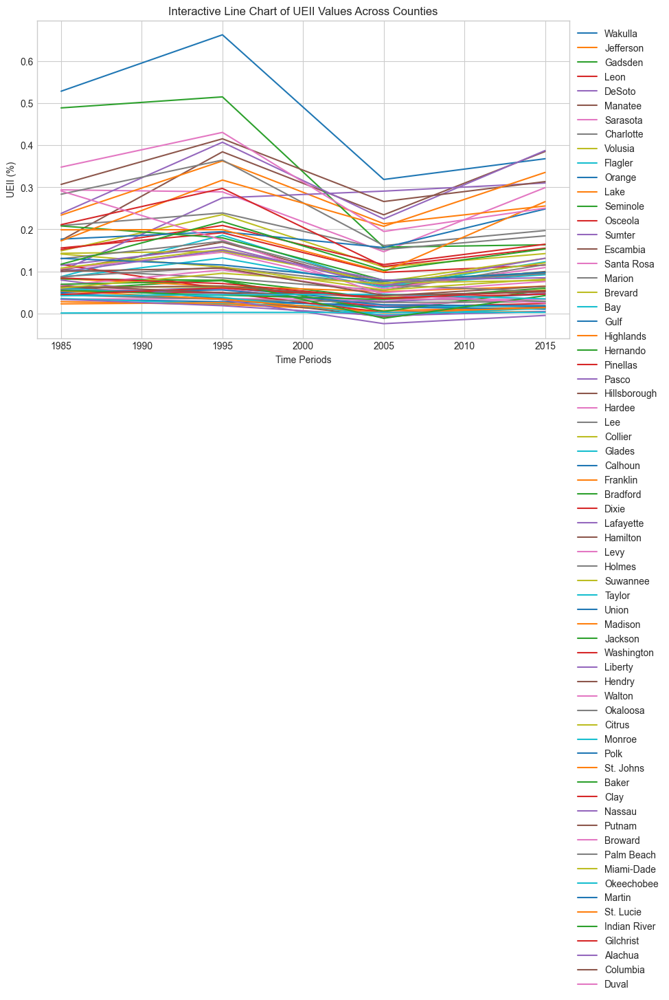

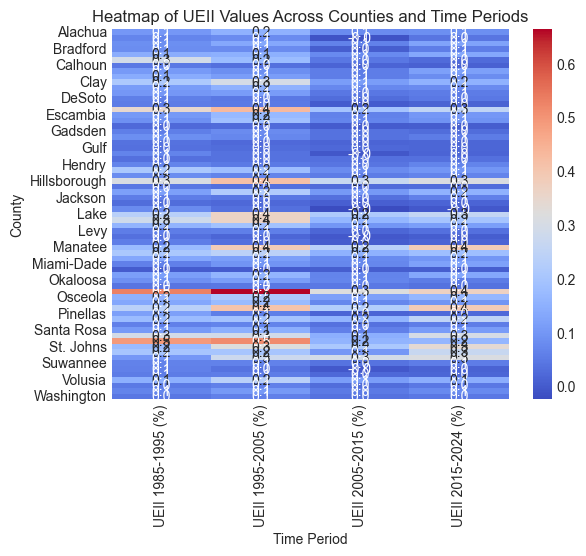

    S.N.        County  County Area (sq mi)  Developed Area 1985 (sq mi)  Developed Area 1995 (sq mi)  Developed Area 2005 (sq mi)  Developed Area 2015 (sq mi)  Developed Area 2024 (sq mi)  UEII 1985-1995 (%)  UEII 1995-2005 (%)  UEII 2005-2015 (%)  UEII 2015-2024 (%)
0      1       Wakulla             736.5335                      29.9469                      33.6212                      38.1216                      40.1324                      43.1760              0.0499              0.0611              0.0273              0.0459
1      2     Jefferson             637.2036                      23.7893                      25.5653                      26.8942                      27.3064                      28.1511              0.0279              0.0209              0.0065              0.0147
2      3       Gadsden             529.0682                      36.8055                      39.8032                      43.9973                      45.8703                      47.2149     

In [83]:
import ee
import pandas as pd
import folium
import matplotlib.pyplot as plt
import seaborn as sns

# Initialize Earth Engine
try:
    ee.Initialize()
except Exception as e:
    ee.Authenticate()
    ee.Initialize()

# --- 1. SETUP ---
nlcd_collection = ee.ImageCollection("projects/sat-io/open-datasets/USGS/ANNUAL_NLCD/LANDCOVER")
target_years = [1985, 1995, 2005, 2015, 2024]
developed_classes = [21, 22, 23, 24]
scale = 30
sqm_to_sqmi = 3.86102159e-7

nlcd_images = ee.Dictionary({
    year: nlcd_collection.filter(ee.Filter.eq('year', year)).first().select('b1')
    for year in target_years
})

counties_collection = ee.FeatureCollection("TIGER/2018/Counties")
florida_counties = counties_collection.filter(ee.Filter.eq('STATEFP', '12'))

# --- 2. FUNCTIONS ---
def calculate_developed_area(image, geometry):
    mask = image.remap(developed_classes, [1] * len(developed_classes), 0).selfMask()
    area_image = mask.multiply(ee.Image.pixelArea()).rename('area')
    stats = area_image.reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=geometry,
        scale=scale,
        maxPixels=1e13
    )
    return ee.Number(stats.get('area')).multiply(sqm_to_sqmi)

def compute_ueii(area_t1, area_t2, delta_t, total_area):
    return (ee.Number(area_t2).subtract(area_t1)
            .divide(ee.Number(total_area).multiply(delta_t))).multiply(100)

def analyze_county(feature):
    geom = feature.geometry()
    county_area_sqmi = ee.Number(geom.area(maxError=1)).multiply(sqm_to_sqmi)
    dev_areas = ee.Dictionary({
        str(year): calculate_developed_area(ee.Image(nlcd_images.get(str(year))), geom)
        for year in target_years
    })
    ueii_85_95 = compute_ueii(dev_areas.get('1985'), dev_areas.get('1995'), 10, county_area_sqmi)
    ueii_95_05 = compute_ueii(dev_areas.get('1995'), dev_areas.get('2005'), 10, county_area_sqmi)
    ueii_05_15 = compute_ueii(dev_areas.get('2005'), dev_areas.get('2015'), 10, county_area_sqmi)
    ueii_15_24 = compute_ueii(dev_areas.get('2015'), dev_areas.get('2024'), 9, county_area_sqmi)
    return feature.set({
        'County Area (sq mi)': county_area_sqmi,
        'Developed Area 1985 (sq mi)': dev_areas.get('1985'),
        'Developed Area 1995 (sq mi)': dev_areas.get('1995'),
        'Developed Area 2005 (sq mi)': dev_areas.get('2005'),
        'Developed Area 2015 (sq mi)': dev_areas.get('2015'),
        'Developed Area 2024 (sq mi)': dev_areas.get('2024'),
        'UEII 1985-1995 (%)': ueii_85_95,
        'UEII 1995-2005 (%)': ueii_95_05,
        'UEII 2005-2015 (%)': ueii_05_15,
        'UEII 2015-2024 (%)': ueii_15_24
    })

# --- 3. BATCH PROCESSING ---
county_list = florida_counties.toList(florida_counties.size())
batch_size = 5
n_counties = florida_counties.size().getInfo()

all_features = []
for start in range(0, n_counties, batch_size):
    subset = ee.FeatureCollection(county_list.slice(start, start + batch_size))
    subset_results = subset.map(analyze_county).getInfo()
    all_features.extend(subset_results['features'])

# --- 4. BUILD DATAFRAME ---
data_for_df = []
for i, feature in enumerate(all_features):
    props = feature['properties']
    row_data = {'S.N.': i + 1, 'County': props['NAME']}
    row_data.update(props)
    data_for_df.append(row_data)

df = pd.DataFrame(data_for_df)
final_columns = [
    'S.N.', 'County', 'County Area (sq mi)',
    'Developed Area 1985 (sq mi)', 'Developed Area 1995 (sq mi)',
    'Developed Area 2005 (sq mi)', 'Developed Area 2015 (sq mi)',
    'Developed Area 2024 (sq mi)', 'UEII 1985-1995 (%)',
    'UEII 1995-2005 (%)', 'UEII 2005-2015 (%)', 'UEII 2015-2024 (%)'
]
df = df[final_columns].round(4)

# --- 5. VISUALIZATIONS ---
# Interactive Line Chart
plt.figure(figsize=(10, 6))
for county in df['County'].unique():
    county_data = df[df['County'] == county]
    plt.plot(target_years[:-1], [
        county_data['UEII 1985-1995 (%)'].values[0],
        county_data['UEII 1995-2005 (%)'].values[0],
        county_data['UEII 2005-2015 (%)'].values[0],
        county_data['UEII 2015-2024 (%)'].values[0]
    ], label=county)
plt.title('Interactive Line Chart of UEII Values Across Counties')
plt.xlabel('Time Periods')
plt.ylabel('UEII (%)')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

# Prepare data for heatmap
heatmap_df = df.melt(
    id_vars=['County'],
    value_vars=[
        'UEII 1985-1995 (%)',
        'UEII 1995-2005 (%)',
        'UEII 2005-2015 (%)',
        'UEII 2015-2024 (%)'
    ],
    var_name='Time Period',
    value_name='UEII (%)'
)

heatmap_data = heatmap_df.pivot(index='County', columns='Time Period', values='UEII (%)')

sns.heatmap(heatmap_data, annot=True, fmt=".1f", cmap='coolwarm')
plt.title('Heatmap of UEII Values Across Counties and Time Periods')
plt.show()


# Get Florida counties GeoJSON
fl_counties_geo = florida_counties.getInfo()

# Merge geometry with DataFrame
# Create a DataFrame from GeoJSON features
geo_df = pd.DataFrame([
    {
        'County': f['properties']['NAME'],
        'geometry': f['geometry']
    }
    for f in fl_counties_geo['features']
])

# Merge with your UEII data
merged_df = geo_df.merge(df, on='County')

# Create map
m = folium.Map(location=[27.9944024, -81.7602544], zoom_start=7)

# Add choropleth
folium.Choropleth(
    geo_data={"type": "FeatureCollection", "features": fl_counties_geo['features']},
    data=merged_df,
    columns=['County', 'UEII 2015-2024 (%)'],
    key_on='feature.properties.NAME',
    fill_color='YlGnBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='UEII 2015-2024 (%)'
).add_to(m)

m.save('choropleth_map.html')


print(df.to_string())

m

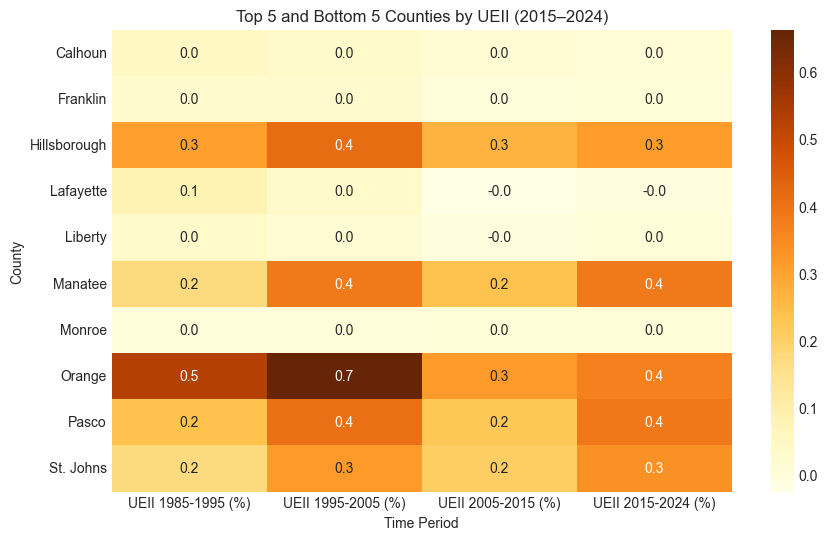

    S.N.        County  County Area (sq mi)  Developed Area 1985 (sq mi)  Developed Area 1995 (sq mi)  Developed Area 2005 (sq mi)  Developed Area 2015 (sq mi)  Developed Area 2024 (sq mi)  UEII 1985-1995 (%)  UEII 1995-2005 (%)  UEII 2005-2015 (%)  UEII 2015-2024 (%)
0      1       Wakulla             736.5335                      29.9469                      33.6212                      38.1216                      40.1324                      43.1760              0.0499              0.0611              0.0273              0.0459
1      2     Jefferson             637.2036                      23.7893                      25.5653                      26.8942                      27.3064                      28.1511              0.0279              0.0209              0.0065              0.0147
2      3       Gadsden             529.0682                      36.8055                      39.8032                      43.9973                      45.8703                      47.2149     

In [84]:
import ee
import pandas as pd
import folium
import matplotlib.pyplot as plt
import seaborn as sns

# Initialize Earth Engine
try:
    ee.Initialize()
except Exception as e:
    ee.Authenticate()
    ee.Initialize()

# --- 1. SETUP ---
nlcd_collection = ee.ImageCollection("projects/sat-io/open-datasets/USGS/ANNUAL_NLCD/LANDCOVER")
target_years = [1985, 1995, 2005, 2015, 2024]
developed_classes = [21, 22, 23, 24]
scale = 30
sqm_to_sqmi = 3.86102159e-7

nlcd_images = ee.Dictionary({
    year: nlcd_collection.filter(ee.Filter.eq('year', year)).first().select('b1')
    for year in target_years
})

counties_collection = ee.FeatureCollection("TIGER/2018/Counties")
florida_counties = counties_collection.filter(ee.Filter.eq('STATEFP', '12'))

# --- 2. FUNCTIONS ---
def calculate_developed_area(image, geometry):
    mask = image.remap(developed_classes, [1] * len(developed_classes), 0).selfMask()
    area_image = mask.multiply(ee.Image.pixelArea()).rename('area')
    stats = area_image.reduceRegion(
        reducer=ee.Reducer.sum(),
        geometry=geometry,
        scale=scale,
        maxPixels=1e13
    )
    return ee.Number(stats.get('area')).multiply(sqm_to_sqmi)

def compute_ueii(area_t1, area_t2, delta_t, total_area):
    return (ee.Number(area_t2).subtract(area_t1)
            .divide(ee.Number(total_area).multiply(delta_t))).multiply(100)

def analyze_county(feature):
    geom = feature.geometry()
    county_area_sqmi = ee.Number(geom.area(maxError=1)).multiply(sqm_to_sqmi)
    dev_areas = ee.Dictionary({
        str(year): calculate_developed_area(ee.Image(nlcd_images.get(str(year))), geom)
        for year in target_years
    })
    ueii_85_95 = compute_ueii(dev_areas.get('1985'), dev_areas.get('1995'), 10, county_area_sqmi)
    ueii_95_05 = compute_ueii(dev_areas.get('1995'), dev_areas.get('2005'), 10, county_area_sqmi)
    ueii_05_15 = compute_ueii(dev_areas.get('2005'), dev_areas.get('2015'), 10, county_area_sqmi)
    ueii_15_24 = compute_ueii(dev_areas.get('2015'), dev_areas.get('2024'), 9, county_area_sqmi)
    return feature.set({
        'County Area (sq mi)': county_area_sqmi,
        'Developed Area 1985 (sq mi)': dev_areas.get('1985'),
        'Developed Area 1995 (sq mi)': dev_areas.get('1995'),
        'Developed Area 2005 (sq mi)': dev_areas.get('2005'),
        'Developed Area 2015 (sq mi)': dev_areas.get('2015'),
        'Developed Area 2024 (sq mi)': dev_areas.get('2024'),
        'UEII 1985-1995 (%)': ueii_85_95,
        'UEII 1995-2005 (%)': ueii_95_05,
        'UEII 2005-2015 (%)': ueii_05_15,
        'UEII 2015-2024 (%)': ueii_15_24
    })

# --- 3. BATCH PROCESSING ---
county_list = florida_counties.toList(florida_counties.size())
batch_size = 5
n_counties = florida_counties.size().getInfo()

all_features = []
for start in range(0, n_counties, batch_size):
    subset = ee.FeatureCollection(county_list.slice(start, start + batch_size))
    subset_results = subset.map(analyze_county).getInfo()
    all_features.extend(subset_results['features'])

# --- 4. BUILD DATAFRAME ---
data_for_df = []
for i, feature in enumerate(all_features):
    props = feature['properties']
    row_data = {'S.N.': i + 1, 'County': props['NAME']}
    row_data.update(props)
    data_for_df.append(row_data)

df = pd.DataFrame(data_for_df)
final_columns = [
    'S.N.', 'County', 'County Area (sq mi)',
    'Developed Area 1985 (sq mi)', 'Developed Area 1995 (sq mi)',
    'Developed Area 2005 (sq mi)', 'Developed Area 2015 (sq mi)',
    'Developed Area 2024 (sq mi)', 'UEII 1985-1995 (%)',
    'UEII 1995-2005 (%)', 'UEII 2005-2015 (%)', 'UEII 2015-2024 (%)'
]
df = df[final_columns].round(4)

# --- 5. HEATMAP: Top 5 & Bottom 5 by UEII 2015–2024 ---
top5 = df.nlargest(5, 'UEII 2015-2024 (%)')
bottom5 = df.nsmallest(5, 'UEII 2015-2024 (%)')
heatmap_df = pd.concat([top5, bottom5])

# Melt for heatmap
heatmap_long = heatmap_df.melt(
    id_vars=['County'],
    value_vars=[
        'UEII 1985-1995 (%)',
        'UEII 1995-2005 (%)',
        'UEII 2005-2015 (%)',
        'UEII 2015-2024 (%)'
    ],
    var_name='Time Period',
    value_name='UEII (%)'
)

# Pivot for plotting
heatmap_data = heatmap_long.pivot(index='County', columns='Time Period', values='UEII (%)')

plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, annot=True, fmt=".1f", cmap='YlOrBr')
plt.title('Top 5 and Bottom 5 Counties by UEII (2015–2024)')
plt.xlabel('Time Period')
plt.ylabel('County')
plt.show()

# --- 6. CHOROPLETH MAP FOR ALL COUNTIES ---
# Get Florida counties GeoJSON
fl_counties_geo = florida_counties.getInfo()

# Create DataFrame from GeoJSON features
geo_df = pd.DataFrame([
    {
        'County': f['properties']['NAME'],
        'geometry': f['geometry']
    }
    for f in fl_counties_geo['features']
])

# Merge with UEII data
merged_df = geo_df.merge(df, on='County')

# Create map
m = folium.Map(location=[27.9944024, -81.7602544], zoom_start=7)

# Add choropleth
folium.Choropleth(
    geo_data={"type": "FeatureCollection", "features": fl_counties_geo['features']},
    data=merged_df,
    columns=['County', 'UEII 2015-2024 (%)'],
    key_on='feature.properties.NAME',
    fill_color='YlOrBr',  # red-brownish palette
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='UEII 2015-2024 (%)'
).add_to(m)

# Add county name labels
for _, row in merged_df.iterrows():
    centroid = ee.Geometry(row['geometry']).centroid().getInfo()['coordinates']
    folium.Marker(
        location=[centroid[1], centroid[0]],
        popup=row['County'],
        icon=folium.DivIcon(html=f"""<div style="font-size:8pt; text-align:center">{row['County']}</div>""")
    ).add_to(m)

m.save('choropleth_map.html')

print(df.to_string())


In [85]:
m